In [61]:
from PIL import Image, ImageOps
import numpy as np
import os
from glob import glob
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras import layers,models
from tensorflow.keras.optimizers import Adam


# 데이터 가져오기
## True - 탈모
## False - 비 탈모

In [62]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [63]:
!unzip /content/drive/MyDrive/nvidia/our_dataset.zip

Archive:  /content/drive/MyDrive/nvidia/our_dataset.zip
replace our_dataset/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [64]:
mother_path = '/content/our_dataset'

glob(mother_path+'/*/*')

['/content/our_dataset/False/False-27.jpeg',
 '/content/our_dataset/False/False-37.jpeg',
 '/content/our_dataset/False/False-33.jpeg',
 '/content/our_dataset/False/False-44.jpeg',
 '/content/our_dataset/False/False-23.jpeg',
 '/content/our_dataset/False/False-40.jpeg',
 '/content/our_dataset/False/False-12.jpeg',
 '/content/our_dataset/False/False-42.jpeg',
 '/content/our_dataset/False/False-31.jpeg',
 '/content/our_dataset/False/False-34.jpeg',
 '/content/our_dataset/False/False-19.jpeg',
 '/content/our_dataset/False/False-39.jpeg',
 '/content/our_dataset/False/False-14.jpeg',
 '/content/our_dataset/False/False-36.jpeg',
 '/content/our_dataset/False/False-06.jpeg',
 '/content/our_dataset/False/False-25.jpeg',
 '/content/our_dataset/False/False-18.jpeg',
 '/content/our_dataset/False/False-11.jpeg',
 '/content/our_dataset/False/False-32.jpeg',
 '/content/our_dataset/False/False-46.jpeg',
 '/content/our_dataset/False/False-51.jpeg',
 '/content/our_dataset/False/False-17.jpeg',
 '/content

# 데이터 전처리

In [65]:
# 데이터 수가 적어서 데이터 증강할 함수 생성
def augment_image(image):
    augmented_images = []
    # 원본 이미지 및 수평 뒤집기 적용
    flips = [image, ImageOps.mirror(image)]
    for img in flips:
        # 크기 조정 및 RGB 변환
        processed_img = img.resize((128, 128)).convert('RGB')
        augmented_images.append(processed_img)
    return augmented_images


In [66]:
# 이미지 데이터와 레이블을 저장할 리스트
train = []
label = []

# 'True', 'False' 폴더 각각에 대해 반복
folder_list = ['False','Ture']  # 폴더 이름 오타난채로 진행
for idx, folder_name in enumerate(folder_list):
    folder = os.path.join(mother_path, folder_name)
    all_files_path = glob(folder + '/*')
    for k, file_path in enumerate(all_files_path):
        img = Image.open(file_path)
        # 이미지 증강
        augmented_images = augment_image(img)
        for aug_img in augmented_images:
            np_img = np.array(aug_img)
            train.append(np_img)
            label.append(idx)  # 'True' 폴더의 이미지에 대해서는 1, 'False' 폴더의 이미지에 대해서는 0을 할당
        if k % 10 == 0:
            print(f'{k} / {len(all_files_path)}')

# numpy 배열로 변환
np_train = np.array(train)
np_label = np.array(label)


0 / 54
10 / 54
20 / 54
30 / 54
40 / 54
50 / 54
0 / 167
10 / 167
20 / 167
30 / 167
40 / 167
50 / 167
60 / 167
70 / 167
80 / 167
90 / 167
100 / 167
110 / 167
120 / 167
130 / 167
140 / 167
150 / 167
160 / 167


#데이터 확인

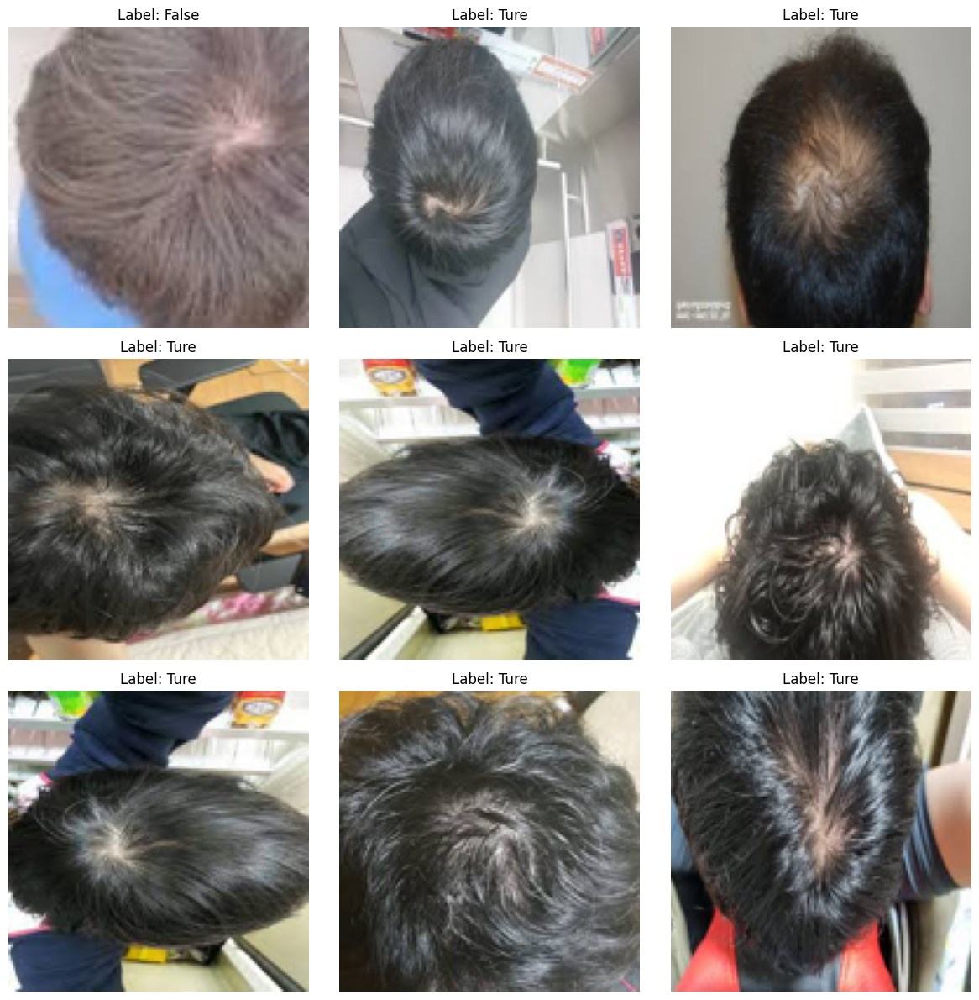

In [67]:
indices = np.random.choice(range(len(np_train)), 9, replace=False)

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
for i, ax in enumerate(axes.ravel()):
    idx = indices[i]
    ax.imshow(np_train[idx])
    ax.set_title(f'Label: {folder_list[np_label[idx]]}')
    ax.axis('off')
plt.tight_layout()
plt.show()


In [68]:
print(np.bincount(np_label))
print(np_train.shape)

[108 334]
(442, 128, 128, 3)


#데이터 수정
### cv 를 통해 데이터를 정수리 부분으로 맞춰서 학습할예정

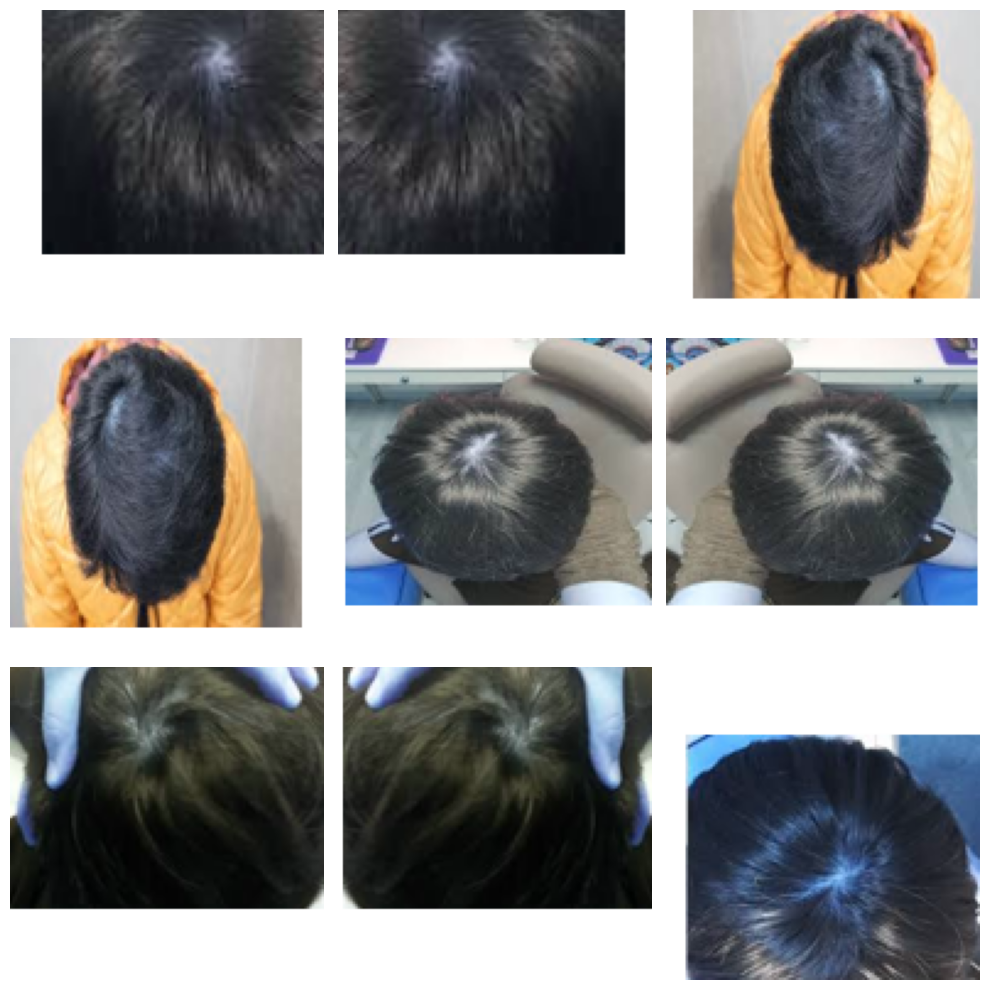

In [69]:
def center_scalp_in_image(np_image):
    # 이미지를 그레이스케일로 변환하고, 머리카락(검정색) 영역을 찾습니다.
    gray_image = cv2.cvtColor(np_image, cv2.COLOR_RGB2GRAY)
    _, binary_image = cv2.threshold(gray_image, 50, 255, cv2.THRESH_BINARY_INV)

    # 머리카락 영역의 중심을 찾습니다.
    moments = cv2.moments(binary_image)
    if moments["m00"] != 0:
        cx = int(moments["m10"] / moments["m00"])
        cy = int(moments["m01"] / moments["m00"])
    else:
        # 중심을 찾을 수 없는 경우, 이미지의 중앙을 사용합니다.
        cy, cx = np_image.shape[:2]
        cy //= 2
        cx //= 2

    # 이미지를 재배치하여 머리카락 중심이 이미지 중앙에 오도록 합니다.
    rows, cols = np_image.shape[:2]
    shiftx = cols//2 - cx
    shifty = rows//2 - cy
    M = np.float32([[1, 0, shiftx], [0, 1, shifty]])
    centered_image = cv2.warpAffine(np_image, M, (cols, rows), borderMode=cv2.BORDER_CONSTANT, borderValue=(255,255,255))

    return centered_image

def visualize_centered_images(np_images, num_images=9):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        centered_img = center_scalp_in_image(np_images[i])
        ax = plt.subplot(3, 3, i + 1)
        ax.imshow(cv2.cvtColor(centered_img, cv2.COLOR_BGR2RGB))
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# np_train 배열을 사용하여 시각화 실행
visualize_centered_images(np_train)


#데이터 나누기

In [70]:
np_train_centered = np.array([center_scalp_in_image(img) for img in np_train])

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(np_train_centered, np_label, test_size=0.2, stratify=np_label)



In [71]:
x_train = x_train/255.
x_test = x_test/255.

# GoogLeNet 만들기

In [72]:

input_layer = layers.Input(shape=(128,128,3), name='start layer')
tower_1 = layers.Conv2D(64 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu',name = 'tower_1' )(input_layer)
tower_2 = layers.Conv2D(64 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu' , name= 'tower_2_1')(input_layer)
tower_2 = layers.Conv2D(64 , kernel_size=(3,3) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_2_2')(tower_2)
tower_3 = layers.Conv2D(64 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_3_1')(input_layer)
tower_3 = layers.Conv2D(64 , kernel_size=(5,5) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_3_2')(tower_3)
tower_4 = layers.MaxPool2D(pool_size=(3,3) , strides=(1,1) ,
                           padding='same', name= 'tower_4_1')(input_layer)
tower_4 = layers.Conv2D(64 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_4_2')(tower_4)
#
concat_layer = layers.concatenate([tower_1,tower_2,tower_3,tower_4],axis=3)
concat_layer = layers.MaxPool2D(pool_size=(3,3) , strides=(2,2), padding='valid')(concat_layer)
##
tower_2_1 = layers.Conv2D(120 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu',name = 'tower_2_1_1' )(concat_layer)
tower_2_2_1 = layers.Conv2D(120 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu' , name= 'tower_2_2_1')(concat_layer)
tower_2_2_2 = layers.Conv2D(120 , kernel_size=(3,3) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_2_2_2')(tower_2_2_1)
tower_2_3_1 = layers.Conv2D(120 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_2_3_1')(concat_layer)
tower_2_3_2 = layers.Conv2D(120 , kernel_size=(5,5) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_2_3_2')(tower_2_3_1)
tower_2_4_1 = layers.MaxPool2D(pool_size=(3,3) , strides=(1,1) ,
                           padding='same', name= 'tower_2_4_1')(concat_layer)
tower_2_4_2 = layers.Conv2D(120 , kernel_size=(1,1) ,
                        padding='same', strides=(1,1),
                        activation='relu', name= 'tower_2_4_2')(tower_2_4_1)
concat_layer_2 = layers.concatenate([tower_2_1,tower_2_2_2,tower_2_3_2,tower_2_4_2],
                                  axis=3)
concat_layer_2 = layers.MaxPool2D(pool_size=(3,3) , strides=(2,2), padding='valid')(concat_layer_2)
#
last_avg_pool = layers.AveragePooling2D(pool_size=(31,31) , strides=(1,1), padding='valid')(concat_layer_2)
flat_layer = layers.Flatten()(last_avg_pool)
output_layer = layers.Dense(1 ,activation='sigmoid')(flat_layer)
model = models.Model(input_layer,output_layer)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 start layer (InputLayer)    [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 tower_2_1 (Conv2D)          (None, 128, 128, 64)         256       ['start layer[0][0]']         
                                                                                                  
 tower_3_1 (Conv2D)          (None, 128, 128, 64)         256       ['start layer[0][0]']         
                                                                                                  
 tower_4_1 (MaxPooling2D)    (None, 128, 128, 3)          0         ['start layer[0][0]']         
                                                                                            

In [73]:
!mkdir tensorboard_log

mkdir: cannot create directory ‘tensorboard_log’: File exists


#학습

In [74]:
# 학습률 파라미터 설정
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=100,
    decay_rate=0.96,
    staircase=True)

# Adam 옵티마이저에 학습률 스케줄러 적용
optimizer = Adam(learning_rate=lr_schedule)


In [75]:
# 모델 컴파일
model.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# TensorBoard 콜백 설정
tb = tf.keras.callbacks.TensorBoard(log_dir='/content/tensorboard_log',
                                    histogram_freq=1)

# 모델 학습
model.fit(x_train, y_train,
          validation_data=(x_test, y_test),
          epochs=10,
          callbacks=[tb])


Epoch 1/10
12/12 [==============================] - 7s 311ms/step - loss: 0.5684 - accuracy: 0.7394 - val_loss: 0.5417 - val_accuracy: 0.7528
Epoch 2/10
12/12 [==============================] - 3s 250ms/step - loss: 0.5437 - accuracy: 0.7564 - val_loss: 0.5429 - val_accuracy: 0.7528
Epoch 3/10
12/12 [==============================] - 3s 258ms/step - loss: 0.5831 - accuracy: 0.7564 - val_loss: 0.5401 - val_accuracy: 0.7528
Epoch 4/10
12/12 [==============================] - 3s 251ms/step - loss: 0.5483 - accuracy: 0.7564 - val_loss: 0.5358 - val_accuracy: 0.7528
Epoch 5/10
12/12 [==============================] - 3s 255ms/step - loss: 0.5411 - accuracy: 0.7564 - val_loss: 0.5347 - val_accuracy: 0.7528
Epoch 6/10
12/12 [==============================] - 3s 260ms/step - loss: 0.5403 - accuracy: 0.7564 - val_loss: 0.5337 - val_accuracy: 0.7528
Epoch 7/10
12/12 [==============================] - 3s 248ms/step - loss: 0.5361 - accuracy: 0.7564 - val_loss: 0.5297 - val_accuracy: 0.7528
Epoch 

In [76]:
from google.colab import files
f = files.upload()

Saving test.jpeg to test (2).jpeg


In [77]:
test_file_name = list(f.keys())[0]
img = Image.open(file_path)
img = img.resize((128,128))
img = img.convert('RGB')
data = np.asarray(img)
test_image_tensor = np.array([data])
test_image_tensor = test_image_tensor/255.
test_image_tensor.shape

(1, 128, 128, 3)

In [78]:
result = model.predict(test_image_tensor)
if result[0][0] > 0.5:
    print(f'{folder_list[1]} 일 확률이 {result[0][0] * 100} % 입니다')
else:
    print(f'{folder_list[0]} 일 확률이 {(1 - result[0][0])* 100} % 입니다')


1/1 [==============================] - 0s 150ms/step
Ture 일 확률이 74.44530129432678 % 입니다


In [79]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [80]:
%tensorboard --logdir /content/tensorboard_log

Reusing TensorBoard on port 6006 (pid 33724), started 0:24:19 ago. (Use '!kill 33724' to kill it.)

<IPython.core.display.Javascript object>

# 다른 모델사용

## 결과는 같음

In [85]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# ResNet50 모델 로드 (ImageNet에서 사전 학습된 가중치 사용)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# 모델의 상단에 새로운 레이어 추가
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)

# 전체 모델 구성
model = Model(inputs=base_model.input, outputs=predictions)

# 처음 몇 개 레이어를 제외한 나머지 레이어의 가중치를 고정 (사전 학습된 가중치 유지)
for layer in base_model.layers:
    layer.trainable = False

# 모델 컴파일
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# 모델 학습
model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=10, batch_size=32)


94765736/94765736 [==============================] - 1s 0us/step
Epoch 1/10
12/12 [==============================] - 9s 286ms/step - loss: 0.5863 - accuracy: 0.7564 - val_loss: 0.5629 - val_accuracy: 0.7528
Epoch 2/10
12/12 [==============================] - 1s 45ms/step - loss: 0.5638 - accuracy: 0.7564 - val_loss: 0.5588 - val_accuracy: 0.7528
Epoch 3/10
12/12 [==============================] - 1s 45ms/step - loss: 0.5534 - accuracy: 0.7564 - val_loss: 0.5627 - val_accuracy: 0.7528
Epoch 4/10
12/12 [==============================] - 1s 44ms/step - loss: 0.5564 - accuracy: 0.7564 - val_loss: 0.5544 - val_accuracy: 0.7528
Epoch 5/10
12/12 [==============================] - 1s 48ms/step - loss: 0.5491 - accuracy: 0.7564 - val_loss: 0.5561 - val_accuracy: 0.7528
Epoch 6/10
12/12 [==============================] - 1s 50ms/step - loss: 0.5477 - accuracy: 0.7564 - val_loss: 0.5529 - val_accuracy: 0.7528
Epoch 7/10
12/12 [==============================] - 1s 44ms/step - loss: 0.5473 - accura

# 후기
데이터 좋지 못해 전처리를 진행했음에도 학습이 진행이 되지않는다
탈모와 비탈모의 이미지를 좀 더 확실한 이미지를 더 많이 수집하고 해봤어야했다

## 안된 이유에 대한 증명을 위한 시각화

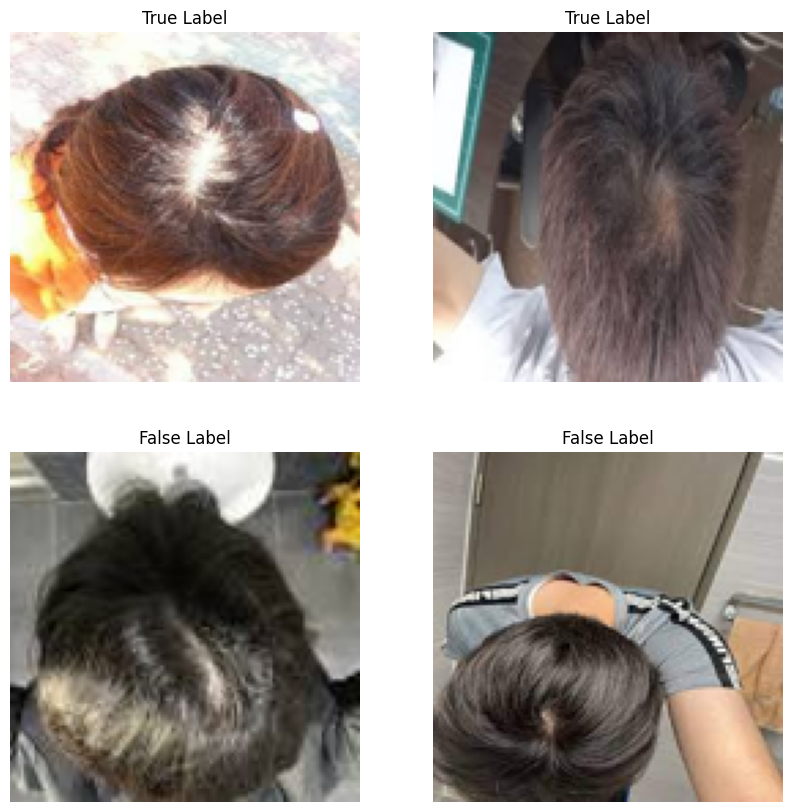

In [84]:

# True 레이블과 False 레이블을 가진 이미지의 인덱스 찾기
true_indices = [i for i, label in enumerate(np_label) if label == 1]
false_indices = [i for i, label in enumerate(np_label) if label == 0]

# 각 레이블에서 랜덤하게 2개씩 인덱스를 선택
selected_true_indices = random.sample(true_indices, 2)
selected_false_indices = random.sample(false_indices, 2)

# 시각화
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
for i, idx in enumerate(selected_true_indices):
    axs[0, i].imshow(np_train[idx])
    axs[0, i].set_title('True Label')
    axs[0, i].axis('off')

for i, idx in enumerate(selected_false_indices):
    axs[1, i].imshow(np_train[idx])
    axs[1, i].set_title('False Label')
    axs[1, i].axis('off')

plt.show()
